This notebook illustrates using clustering and our descriptors compounds.

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
import pickle
pyo.init_notebook_mode()


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

In [5]:
# import data
model_data = pd.read_csv('../data/final/clean_trial4.csv')
data = pd.read_csv("../data/raw/data-descriptors_3k.csv")

In [27]:
data['Texpi'] = 310

In [28]:
model_data.columns

Index(['logkpl', 'Compound', 'SMILES', 'Texpi', 'ALogp2', 'nAcid', 'nAromBond',
       'ATSc2', 'ATSc3', 'ATSc4',
       ...
       'nRings9', 'TopoPSA', 'VAdjMat', 'WTPT-2', 'WTPT-3', 'WTPT-4', 'WTPT-5',
       'WPATH', 'XLogP', 'Zagreb'],
      dtype='object', length=149)

In [29]:
data.columns

Index(['SMILES', 'ALogP', 'ALogp2', 'AMR', 'apol', 'nAcid', 'naAromAtom',
       'nAromBond', 'nAtom', 'ATSc1',
       ...
       'WTPT-1', 'WTPT-2', 'WTPT-3', 'WTPT-4', 'WTPT-5', 'WPATH', 'WPOL',
       'XLogP', 'Zagreb', 'Texpi'],
      dtype='object', length=225)

In [39]:
cols = model_data.columns[3:]
cols

Index(['Texpi', 'ALogp2', 'nAcid', 'nAromBond', 'ATSc2', 'ATSc3', 'ATSc4',
       'ATSc5', 'ATSm1', 'BCUTw-1l',
       ...
       'nRings9', 'TopoPSA', 'VAdjMat', 'WTPT-2', 'WTPT-3', 'WTPT-4', 'WTPT-5',
       'WPATH', 'XLogP', 'Zagreb'],
      dtype='object', length=146)

In [32]:
data.head(2)

,SMILES,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,Texpi
0,CC(=O)O,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,...,6.732051,1.683013,4.488034,4.488034,0.0,9.0,0.0,-0.080,12.0,310
1,C1=CC=C(C=C1)CO,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,...,15.692665,1.961583,2.452455,2.452455,0.0,64.0,7.0,1.211,34.0,310


In [40]:
# getting all descriptors except compound name
without_compound = data.drop(['SMILES'], axis=1)
without_compound.head(2)

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,Texpi
0,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,-0.091012,...,6.732051,1.683013,4.488034,4.488034,0.0,9.0,0.0,-0.080,12.0,310
1,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,-0.042807,...,15.692665,1.961583,2.452455,2.452455,0.0,64.0,7.0,1.211,34.0,310


In [41]:
without_compound = without_compound.drop(["geomShape"], axis=1)

In [42]:
for col in without_compound.columns:
    if without_compound[col].isna().sum() > 0:
        print(col, without_compound[col].isna().sum())
        without_compound[col] =without_compound[col].fillna(without_compound[col].mean())

apol 1
ATSc1 22
ATSc2 22
ATSc3 22
ATSc4 22
ATSc5 22
ATSm1 1
ATSm2 1
BCUTw-1l 48
BCUTw-1h 48
BCUTc-1l 48
BCUTc-1h 48
BCUTp-1l 48
BCUTp-1h 48
bpol 1
SC-3 3
SC-4 3
SC-5 3
SC-6 3
VC-3 3
VC-4 3
VC-5 3
VC-6 3
SPC-4 3
SPC-5 3
SPC-6 3
VPC-4 3
VPC-5 3
VPC-6 3
SP-0 6
SP-1 6
SP-2 6
SP-3 6
SP-4 6
SP-5 6
SP-6 6
SP-7 6
VP-0 6
VP-1 6
VP-2 6
VP-3 6
VP-4 6
VP-5 6
VP-6 6
VP-7 6
ECCEN 6
FMF 6
Fsp3 6
fragC 6
nHBAcc 6
nHBDon 6
HybRatio 39
JPLogP 67
Kier1 6
Kier2 6
Kier3 37
khs.sLi 6
khs.ssBe 6
khs.ssssBe 6
khs.ssBH 6
khs.sssB 6
khs.ssssB 6
khs.sCH3 6
khs.dCH2 6
khs.ssCH2 6
khs.tCH 6
khs.dsCH 6
khs.aaCH 6
khs.sssCH 6
khs.ddC 6
khs.tsC 6
khs.dssC 6
khs.aasC 6
khs.aaaC 6
khs.ssssC 6
khs.sNH3 6
khs.sNH2 6
khs.ssNH2 6
khs.dNH 6
khs.ssNH 6
khs.aaNH 6
khs.tN 6
khs.sssNH 6
khs.dsN 6
khs.aaN 6
khs.sssN 6
khs.ddsN 6
khs.aasN 6
khs.ssssN 6
khs.sOH 6
khs.dO 6
khs.ssO 6
khs.aaO 6
khs.sF 6
khs.sSiH3 6
khs.ssSiH2 6
khs.sssSiH 6
khs.ssssSi 6
khs.sPH2 6
khs.ssPH 6
khs.sssP 6
khs.dsssP 6
khs.sssssP 6
khs.sSH 6
khs.dS 6
khs.

In [43]:
without_compound.isna().sum().sum()

0

In [44]:
# choosing columns for predicting logkpl
predictor_df = data[cols]

In [45]:
predictor_df

,Texpi,ALogp2,nAcid,nAromBond,ATSc2,ATSc3,ATSc4,ATSc5,ATSm1,BCUTw-1l,...,nRings9,TopoPSA,VAdjMat,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,XLogP,Zagreb
0,310,0.052854,1,0,-0.091012,-0.006287,0.000000,0.000000,5.548938,11.883033,...,0.0,37.30,2.584963,1.683013,4.488034,4.488034,0.000000,9.0,-0.080,12.0
1,310,1.501850,0,6,-0.042807,-0.003064,0.000628,0.000103,8.774469,11.694970,...,0.0,20.23,4.000000,1.961583,2.452455,2.452455,0.000000,64.0,1.211,34.0
2,310,4.173849,1,0,-0.239284,-0.080906,0.232434,-0.112499,9.908918,11.890411,...,0.0,40.13,3.807355,1.784885,7.873996,4.709438,3.164558,66.0,-3.393,34.0
3,310,1.863771,1,0,-0.194745,-0.066675,0.194406,-0.093952,9.908918,11.890411,...,0.0,37.30,3.807355,1.784885,7.873996,4.709438,3.164558,66.0,-2.912,34.0
4,310,1.946025,3,0,-0.209376,0.027215,-0.057755,-0.365272,18.421283,11.803741,...,0.0,132.13,4.584963,1.839881,16.754366,16.754366,0.000000,246.0,-2.247,58.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3101,310,3.495030,0,0,-1.048659,-0.411655,0.466489,0.330088,69.562527,11.775666,...,0.0,196.33,6.930737,1.982777,45.689570,39.525618,6.163953,12725.0,1.555,306.0
3102,310,22.499844,0,0,-0.993770,-0.102394,-0.187529,0.347237,72.842566,11.711400,...,0.0,170.06,7.087463,2.038236,40.868356,40.868356,0.000000,17028.0,2.839,340.0
3103,310,1.247019,0,6,-0.180232,-0.019535,-0.299158,-0.170361,38.915713,11.676529,...,0.0,181.62,6.129283,2.010898,25.945539,20.479335,5.466203,2336.0,0.387,184.0
3104,310,8.943688,0,18,-0.939796,-0.177489,0.794771,-1.101506,90.112266,11.693503,...,0.0,256.50,7.321928,2.039558,58.213655,26.129187,28.949786,23970.0,3.788,390.0


In [47]:
# load the model from disk
loaded_model = pickle.load(open('../models/LGBMRegressor_model.sav', 'rb'))

In [49]:
# making predictions
predictor_df['predicted_logkpl'] =  loaded_model.predict(predictor_df)

In [50]:
# scaling our data by using standard scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(without_compound)

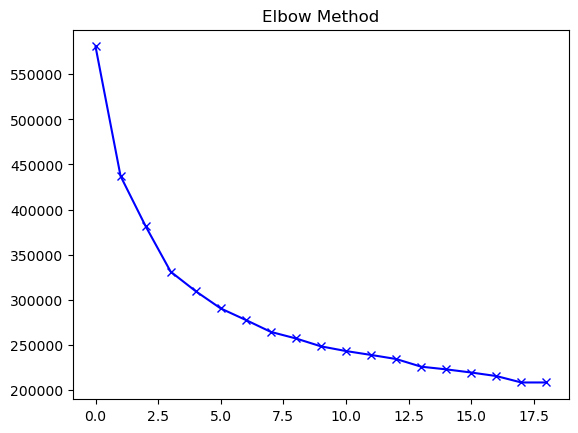

In [51]:
# elbow method
n_clusters = 20
cost = []
for i in range(1, n_clusters):
    kmean= KMeans(i, n_init=10, max_iter=1000)
    kmean.fit(X_scaled)
    cost.append(kmean.inertia_)  

plt.title("Elbow Method")
plt.plot(cost, 'bx-');

In [52]:
kmean = KMeans(4, n_init=10, max_iter=1000) # 4 clusters
kmean.fit(X_scaled)
labels = kmean.labels_

In [53]:
# adding clusters to our data
clusters = pd.concat([without_compound, pd.DataFrame({'cluster': labels})], axis=1)
clusters.head()

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,Texpi,cluster
0,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,-0.091012,...,1.683013,4.488034,4.488034,0.000000,9.0,0.0,-0.080,12.0,310,0
1,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,-0.042807,...,1.961583,2.452455,2.452455,0.000000,64.0,7.0,1.211,34.0,310,0
2,-2.0430,4.173849,26.7438,18.838723,1,0,0,19,0.400512,-0.239284,...,1.784885,7.873996,4.709438,3.164558,66.0,5.0,-3.393,34.0,310,0
3,-1.3652,1.863771,29.0216,19.505516,1,0,0,20,0.321931,-0.194745,...,1.784885,7.873996,4.709438,3.164558,66.0,5.0,-2.912,34.0,310,0
4,-1.3950,1.946025,35.6239,21.508344,3,0,0,21,0.702279,-0.209376,...,1.839881,16.754366,16.754366,0.000000,246.0,16.0,-2.247,58.0,310,0


In [59]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)

# making dataframe for our pca components
pca_df = pd.DataFrame(X_pca, columns=['PCA1','PCA2'])

# adding cluster assignment
pca_df['cluster'] = pd.Categorical(kmean.labels_)

# adding compound name to this dataframe
# pca_df['compound'] = data['Compound']

# get the index of the most important feature on EACH component i.e. largest absolute value
most_important = [np.abs(pca.components_[i]).argmax() for i in range(components)]

# columns/ features of our data
initial_feature_names = without_compound.columns

# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(components)]

# using LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i + 1): most_important_names[i] for i in range(components)}

# explained variance
print("Explained variance ratio", pca.explained_variance_ratio_)
print("\nnSum of Explained variance ratio", pca.explained_variance_ratio_.sum())
print("\nColumns chosen by PCA", dic)


pca_df

Explained variance ratio [0.3930098  0.07487326]

nSum of Explained variance ratio 0.46788306607032853

Columns chosen by PCA {'PC1': 'Zagreb', 'PC2': 'khs.ssssC'}


,PCA1,PCA2,cluster
0,-7.792877,3.207430,0
1,-6.996826,2.663186,0
2,-6.199148,1.731553,0
3,-6.202703,1.657434,0
4,-5.493125,2.307212,0
...,...,...,...
3101,6.494252,-7.922995,2
3102,6.867045,-6.884563,2
3103,0.570989,-1.202860,0
3104,9.168745,0.422488,2


In [60]:
fig = px.scatter(pca_df, x='PCA1', y='PCA2', color="cluster", title="Compounds Clustering", width=800)

# saving the figure in html file
# fig.write_html("../results/compounds_clustering.html")

fig.show()

In [61]:
pca_df['predicted_logkpl'] = predictor_df['predicted_logkpl']

In [62]:
pca_df

,PCA1,PCA2,cluster,predicted_logkpl
0,-7.792877,3.207430,0,-3.197871
1,-6.996826,2.663186,0,-2.815085
2,-6.199148,1.731553,0,-2.754534
3,-6.202703,1.657434,0,-3.648042
4,-5.493125,2.307212,0,-4.029685
...,...,...,...,...
3101,6.494252,-7.922995,2,-2.642881
3102,6.867045,-6.884563,2,-2.731491
3103,0.570989,-1.202860,0,-2.631334
3104,9.168745,0.422488,2,-2.444751


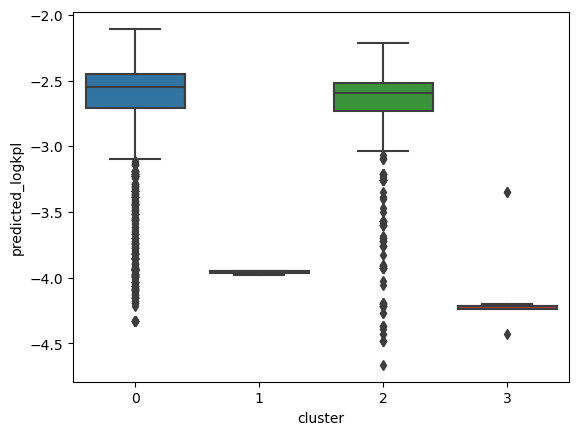

In [63]:
sns.boxplot(x="cluster", y="predicted_logkpl", data=pca_df)
plt.show()

# Interpretation

In [64]:
results = clusters[['cluster']].copy()

In [65]:
results['smiles'] = data['SMILES']

In [66]:
# checking if any smiles is has been assigned to more than one cluster
for co in results['smiles'].unique():
    if results[results['smiles'] == co]['cluster'].nunique() > 1:
        print(co)
print("Finished!")

Finished!


In [67]:
# sorting values by cluster to make it easier to look in excel sheet
results.sort_values('cluster', inplace=True)
results

,cluster,smiles
0,0,CC(=O)O
2843,0,C[NH+](C)C1C2C(C3C(=C)C4=C(C(=CC=C4)O)C(=C3C(=...
1700,0,CCOC(=O)C(CCC1=CC=CC=C1)NC(C)C(=O)N2CCCC2C(=O)O
1701,0,C1=C(OC(=C1)[N+](=O)[O-])C=NNC(=O)N
1702,0,CC[N+](CC)(CC)CCOC1=C(C(=CC=C1)OCC[N+](CC)(CC)...
...,...,...
2478,3,CCC(C)C(C(=O)NC(CCC(=O)O)C(=O)NC(CC1=CNC2=CC=C...
3053,3,CCC(C)C(C(=O)NC(C)C(=O)NC(CC1=CNC2=CC=CC=C21)C...
3054,3,CCC(C)C(C(=O)NC(CCC(=O)N)C(=O)NC(CC(=O)O)C(=O)...
2135,3,CC(C)C(C(=O)NCC(=O)NC(CCCCN)C(=O)NC(CCCCN)C(=O...


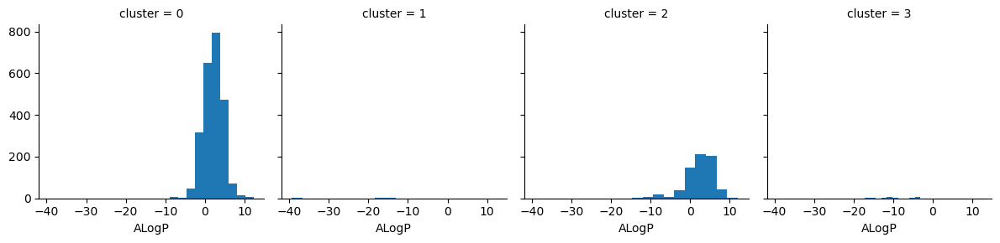

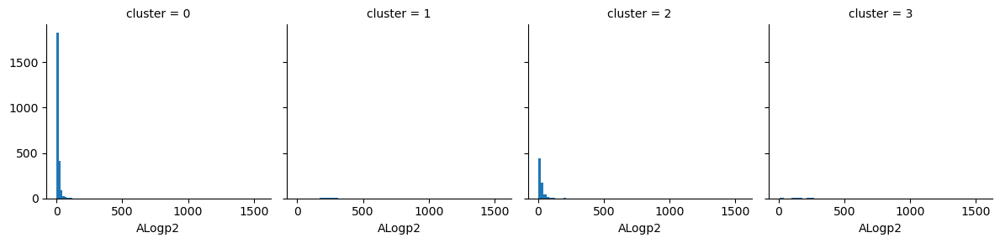

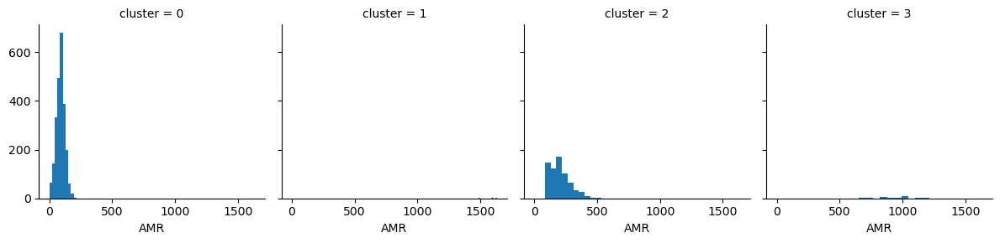

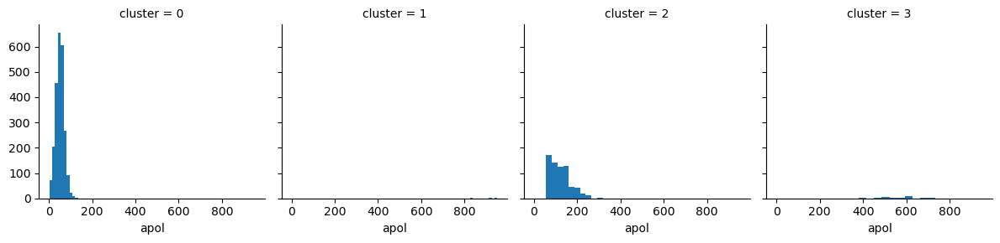

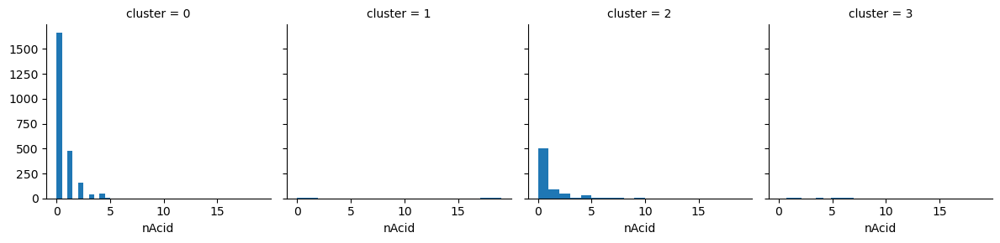

...

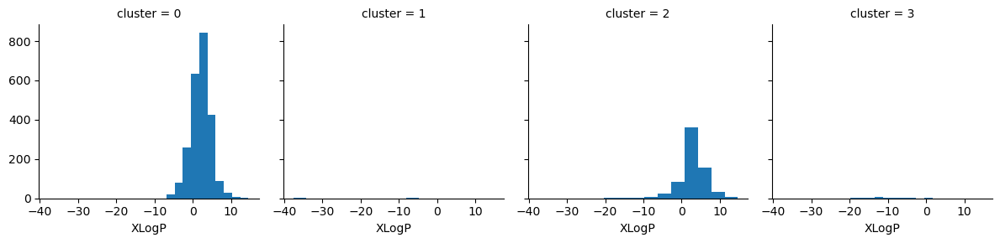

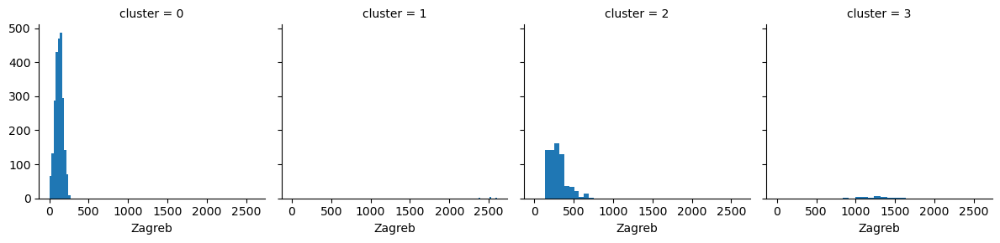

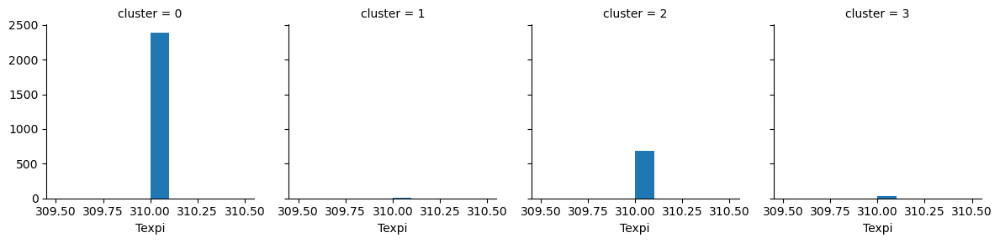

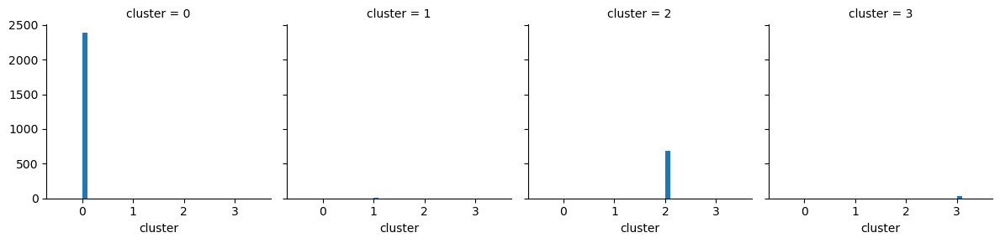

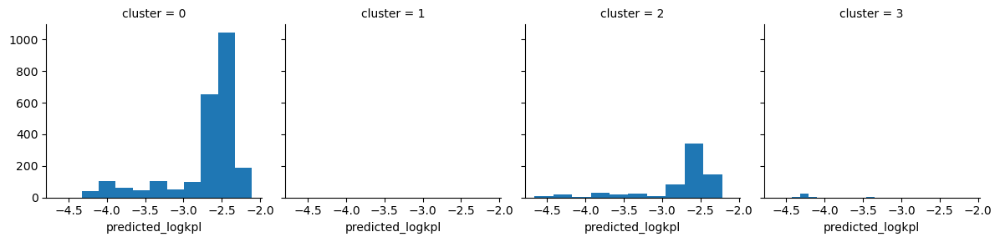

In [72]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(plt.hist, c)

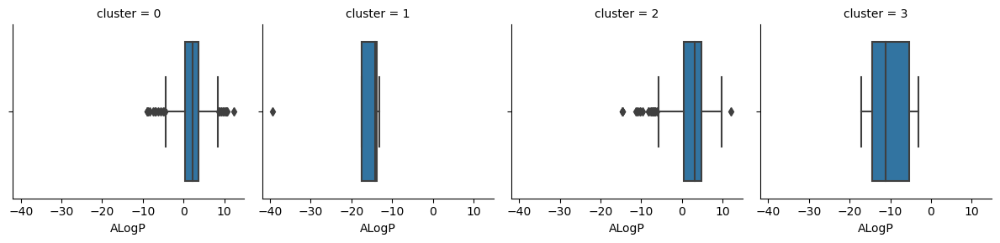

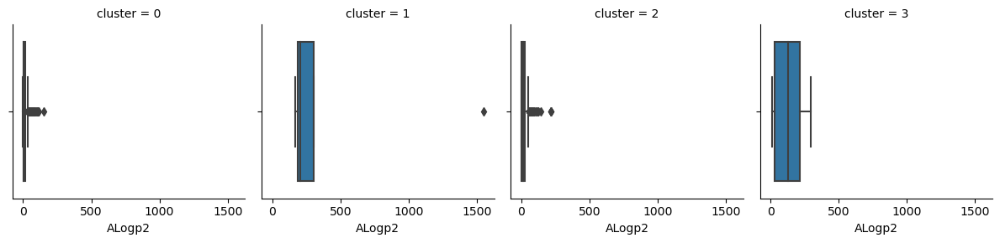

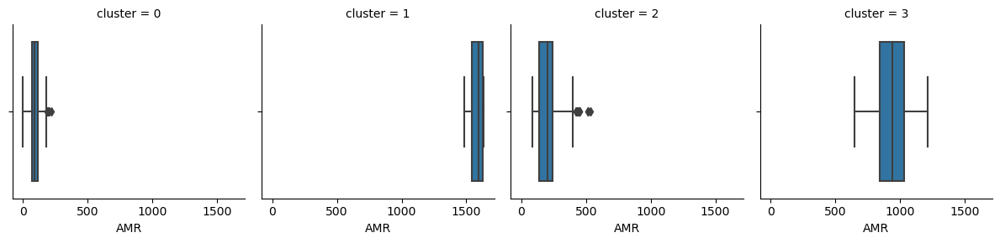

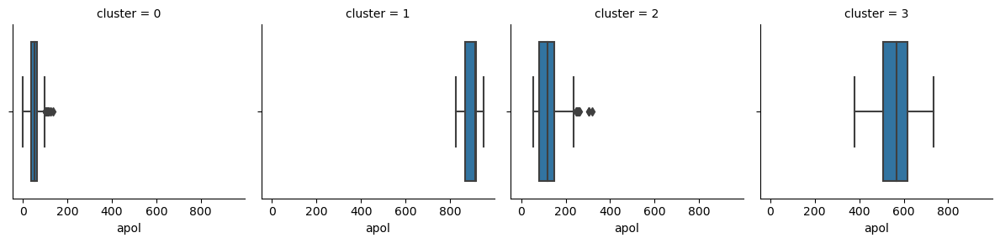

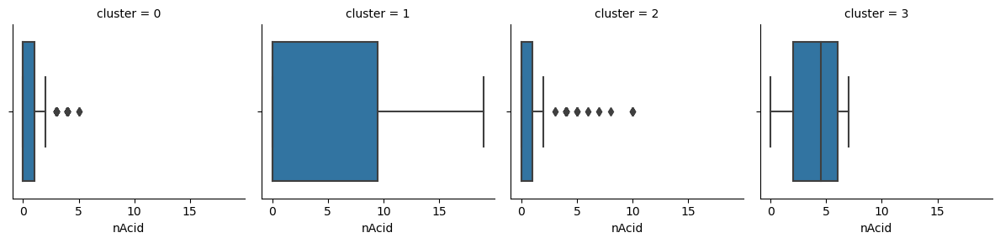

...

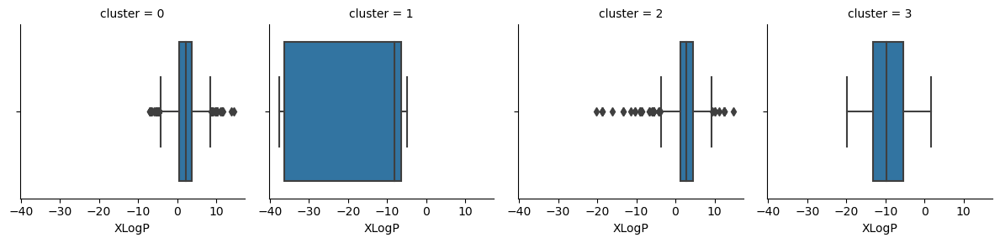

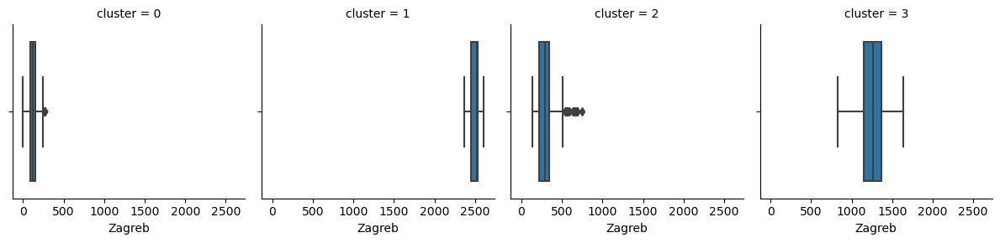

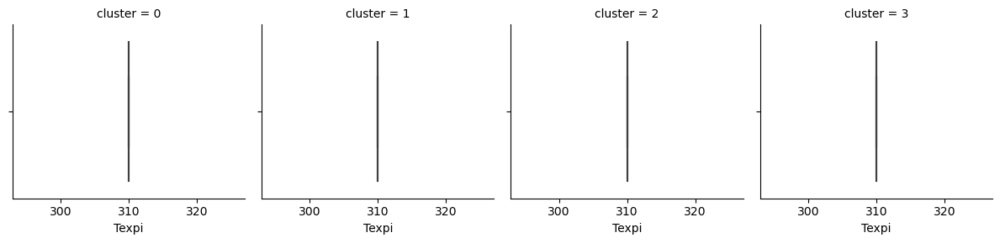

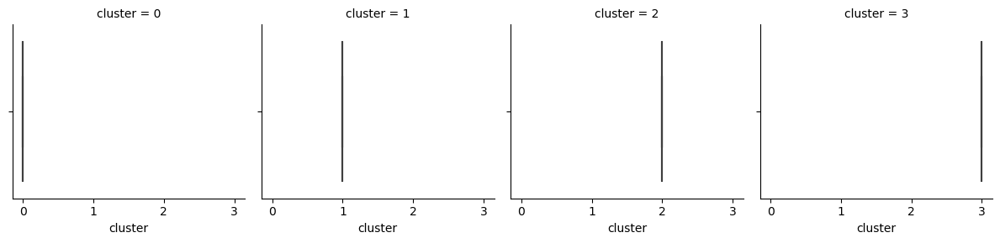

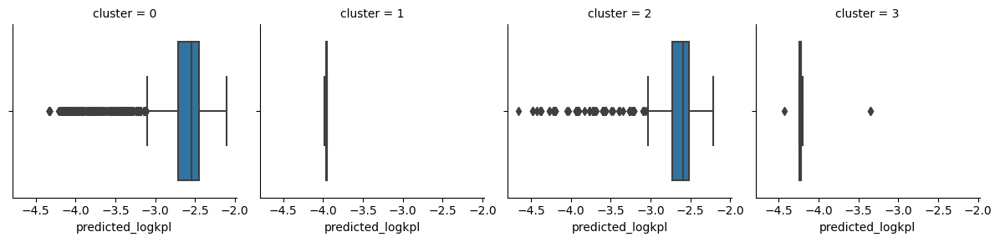

In [73]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(sns.boxplot, c)

In [70]:
clusters['predicted_logkpl'] = predictor_df['predicted_logkpl']

In [71]:
# grouping by cluster and getting descriptive values
cluster_analysis = clusters.groupby('cluster', as_index=False)['predicted_logkpl'].agg(['count', 'min', 'max', 'mean', 'std',
                                                                            lambda x: x.quantile(0.75) - x.quantile(0.25), 
                                                                            lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])
cluster_analysis.columns = ['count', 'min', 'max', 'mean', 'std', "IQR", "Q1", "Q3"]
cluster_analysis

,count,min,max,mean,std,IQR,Q1,Q3
cluster,,,,,,,,
0,2385,-4.327108,-2.107182,-2.712437,0.472254,0.262579,-2.711434,-2.448855
1,7,-3.979297,-3.952387,-3.960076,0.013131,0.013455,-3.965842,-3.952387
2,684,-4.663158,-2.217672,-2.739354,0.466595,0.215705,-2.731906,-2.516200
3,30,-4.429370,-3.347984,-4.171925,0.227381,0.021786,-4.240219,-4.218433


In [40]:
# cluster_analysis.to_excel("./clusters_analysis.xlsx")